## Why is dimensionality reduction useful?

Data scientists resort to dimensionality reduction techniques for two main reasons:

1. **Visualization:** Human brains are used to thinking in, at most, three-dimensional space, and they struggle to imagine higher-order dimensions. You can easily understand the orientations and the relationships between the objects in one, two, and three dimensions, but the same isn't true as the dimensionality increases. Because visualization is an important aspect of any exploratory data analysis, you need to reduce the dimensions in your high-dimensional data while keeping as many of the associations, relations, and information as you can. Thus, dimensionality reduction techniques are heavily used for visualization purposes.

2. **The curse of dimensionality:** In machine-learning tasks, you estimate the parameters of your models with the data at hand. The number of observations in the data is usually limited, and collecting additional data is usually very hard—if not impossible. However, if you include a lot of features in your models, the statistical powers may decrease. More formally, the search space for the parameters of the models increases *exponentially* with the number of dimensions (features) of the data. Thus, it makes sense to resort to dimensionality reduction techniques to limit the dimensions in the data. Because you learned about the curse of dimensionality in the exploratory data analysis module, the discussion will be kept short here.

# What is PCA

PCA is probably the most popular dimensionality reduction technique; it's generally the first one that you should try when you need to reduce the dimension of the data. The main idea of PCA is to find a low-dimensional representation of the high-dimensional data by retaining as much variation in the data as possible. Retaining the variation makes sense because of the fact that variance in the data can be thought of as the information in it. So, the objective of PCA is to keep the maximum information from the high-dimensional space retained in the low-dimensional representation.

The representations produced by PCA are called the *principal components*. So, if you want a one-dimensional representation of your data, you take the first principal component. And if you want a two-dimensional representation, you take the first two principal components, and so on. But what exactly are these principal components? The [figure below](http://alexhwilliams.info/itsneuronalblog/2016/03/27/pca/) illustrates how PCA constructs the first principal component:

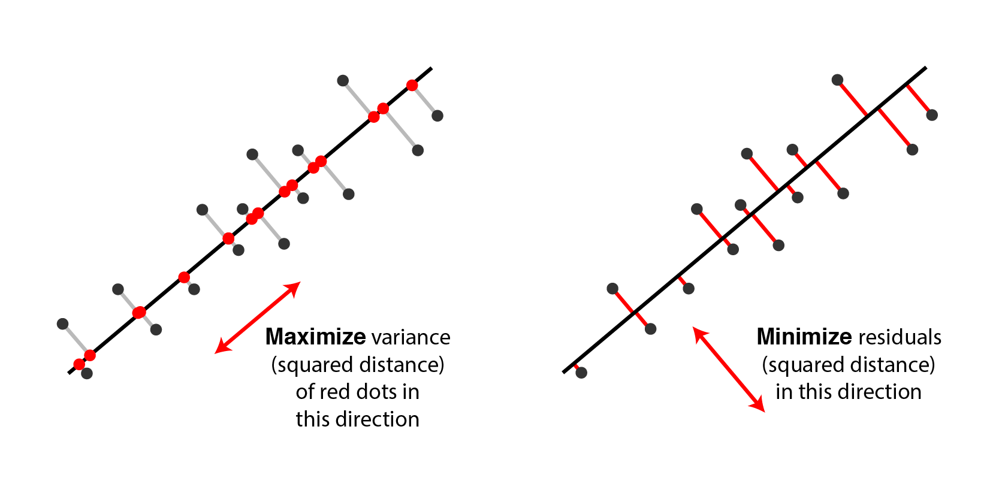

In the figure above, the dots represent the data points. As previously mentioned, PCA tries to retain the variance in the data as much as possible. In doing so, it searches for a line (or more correctly a *vector*) such that the perpendicular projections of the data points on this line (the red dots in the left figure) have the maximum variance. This is equivalent to minimizing the squared distances of the data points to this line (as the figure on the right demonstrates).

But this is just the first principal component. How does PCA find the other components? Actually, PCA does the same thing for all the principal components—but for each component, it imposes an important restriction. For example, it forces the second component to be perpendicular to the first component. So among the perpendicular lines, PCA chooses the one that maximizes the variance (or minimizes the squared distances). PCA restricts the third component to be perpendicular to both first and the second components, and then chooses the one that maximizes variance (or minimizes the squared distances). The rest of the components are also constructed in the same manner. Each component is perpendicular to all of the previous components, and given this constraint, is the one that maximizes the variance in the data.

Now, briefly review how PCA algorithm works.

## The PCA algorithm

The exact analytical derivation of the PCA algorithm is slightly involved. This module won't go into the details of the math to construct the principal components, because that was covered more thoroughly in the exploratory data analysis module. Here, briefly review how the PCA algorithm works:

1. First, PCA calculates the covariance matrix of the variables that you want to transform.

2. Second, it calculates the eigenvectors and the eigenvalues of the covariance matrix calculated in the previous step.

3. Third, it sorts out the eigenvectors with respect to their corresponding eigenvalues, such that the eigenvector with the highest eigenvalue comes first, the eigenvector with the second-highest eigenvalue comes next, and so on. The first principal component is the first eigenvector after sorting, the second principal component is the second eigenvector after sorting, and so forth.

If you want to read more about the mathematical formulation and the solutions of the PCA algorithm, you can start with [this blog post](http://alexhwilliams.info/itsneuronalblog/2016/03/27/pca/). You'll see that the algorithm above has several solution methods, all of which involve different linear algebra methods.

### Some insights on what PCA achieves

Understanding the algorithm of a technique is important. But, to apply it effectively and assess how it performs on different data, you must build the intuition of what that technique achieves. Below, two important insights regarding what PCA accomplishes are discussed. These insights will shed light on the differences between PCA and the other dimensionality reduction methods that will be covered later in this module.

1. The principal components are linear combinations of the original variables. Hence, PCA is a linear dimensionality reduction technique. This point is quite important when comparing different dimensionality reduction methods. Producing a lower-dimensional representation of some complex data, like image, sound and text, is a challenging task, and linear methods may come short of this. Later, you'll learn about another dimensionality reduction technique that is nonlinear, and you'll explore how it compares to PCA.

2. Another important insight regarding what PCA achieves is that PCA preserves the global structure of the similarity in the data. That is to say, the far-away observations (that are dissimilar to each other) in the original dimensions tend to be far away from each other in the lower-dimensional PCA representation too. For example, when you visualize high-dimensional data in the two-dimensional space using the first two principal components, you usually observe that the most dissimilar data points are drawn on opposite sides of the graph.

# Important points to consider

When applying PCA on the datasets, keep the following considerations in mind:

* Before applying PCA, you should always **mean-normalize** your variables. That is, for each variable that you have, **calculate the mean** and **subtract that mean** from every observation of that variable. This makes your variables have mean zero.

* PCA is **sensitive to the scale of the data**. For example, if one variable is the price of houses (in hundred thousands) and another one is the living area of the houses (in hundreds), then the effect of the price variable would be much higher than the effect of the living area variable. So if your variables exhibit different scales, you should always **standardize the variables before applying PCA** to them. Note that standardizing the variables also includes mean normalization—so if you standardize the variables, then you don't need to mean-normalize beforehand.

## PCA in action

It's time to see PCA in action. You already learned how to apply PCA; it was also used earlier in this module when you were visualizing the data. Here, you'll apply it on a famous optical character recognition (OCR) dataset called *MNIST*. This dataset consists of 70,000 grayscale images of handwritten digits. You'll apply PCA on this dataset. Then, you'll visualize the first two principal components to see whether the different digits can be represented in the two-dimensional space such that the same digits are close together and the different digits are separated clearly.

First, import the libraries that you'll use:

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import fetch_openml
from sklearn.decomposition import PCA

Load the *MNIST* dataset using scikit-learn's dataset module. Then use the `fetch_openml()` method from this module to load the *MNIST* data. Note that this method is relatively new to scikit-learn and you need to have at least the `0.20` version of it installed. You can check the version of your scikit-learn by running the following code:

In [ ]:
import sklearn
sklearn.__version__

'1.2.2'

**Note:** You don't have to use this method to download the *MNIST* dataset. The dataset is [available online](http://yann.lecun.com/exdb/mnist/), so you can also download the dataset from that link and then load it in your own way. Notice that the dataset in the link is separated into two (as training and test sets), but this examples will use the combined version. You can combine the training and test sets into one, or you can just use the training set. The results will look similar to each other.

If you want to use the `fetch_openml()` function and your version of scikit-learn is older than `0.20`, you can upgrade your installation by running the following code on the command line:

```bash
pip install --upgrade scikit-learn
```

Once you get the required version, you can load the *MNIST* data:

In [ ]:
# Load the MNIST dataset below
mnist = fetch_openml('mnist_784', version=1, parser='auto', cache=True)

To decrease the computation time, randomly sample 10,000 images from *MNIST*. The computation time of PCA on the whole dataset won't be excessive, but the method that you'll learn about later in this module may run much more slowly. So, to keep the results comparable, you'll sample 10,000 of the observations. You can also try both algorithms on the whole dataset and observe whether increasing the sample size changes the results or not.

In [ ]:
np.random.seed(123)

indices = np.random.choice(len(mnist.data), 10000)
X = mnist.data.loc[indices] / 255.0 # Divide by 255 to normalize for RGB (red, green, blue) in image data
y = mnist.target.loc[indices]

print(X.shape, y.shape)

(10000, 784) (10000,)


As you can see, the size of each image is 784. In fact, all images in *MNIST* are 28 by 28 pixels and 784 is just the result of the multiplication of 28 by 28. So, the data is a flattened version of the images where each row in the 28 x 28 matrix is concatenated side by side.

Plot some images and see what they look like:

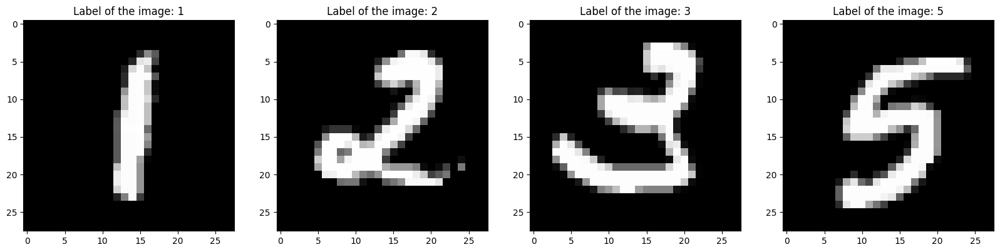

In [ ]:
plt.figure(figsize=(20,5))

plt.subplot(141)
plt.imshow(X.iloc[123].values.reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(y.iloc[123]))

plt.subplot(142)
plt.imshow(X.iloc[124].values.reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(y.iloc[124]))

plt.subplot(143)
plt.imshow(X.iloc[125].values.reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(y.iloc[125]))

plt.subplot(144)
plt.imshow(X.iloc[126].values.reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(y.iloc[126]))

plt.show()

Next, apply PCA to the data. You want to visualize the *MNIST* data in two-dimensional space. So, you only need to use the first two principal components. For this purpose, set `n_components=2` inside the PCA class:

In [ ]:
# You just want the first two principal components
pca = PCA(n_components=2)

# Get the components by
# calling `fit_transform()` method with the data
pca_components = pca.fit_transform(X)

You're all set to visualize the dataset in two-dimensional space using the PCA's first two components. In the graph below, the colors of the data points are set and labeled according to their digits. Note that if you run the following cell, you'll notice that it takes some time to plot the graph. This is not related to PCA at all. It's because the code goes over each of the 10,000 data points to label them with their digits.

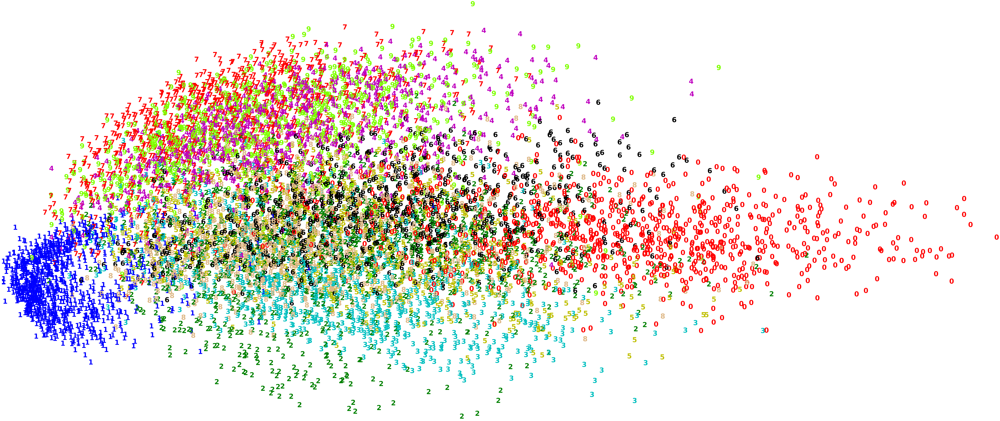

In [ ]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(pca_components.shape[0]):
    plt.text(pca_components[i, 0], pca_components[i, 1], str(y.iloc[i]),
             color=colours[int(y.iloc[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

The graph above reveals how the two-dimensional representations of the ten digits spread along the two axes. Most notably, `0` and `1` values occupy the rightmost and the leftmost regions of the graph, respectively. You may argue that `0` and `1` are the two most dissimilar characters in terms of their shapes. This makes sense, as discussed above, because PCA retains the global similarity structure of the data. So dissimilar objects tend to be located far away from each other in the lower-dimensional representation.

However, local similarities don't seem to be preserved well in the graph above. For example, almost every digit is dispersed along the x-axis and intertwined with other digits. Remember that the true digit information that you have was used to color and tag each data point. But in an unsupervised task, you wouldn't have that information, and it would be difficult to distinguish the different digits in the graph above. Check this below.

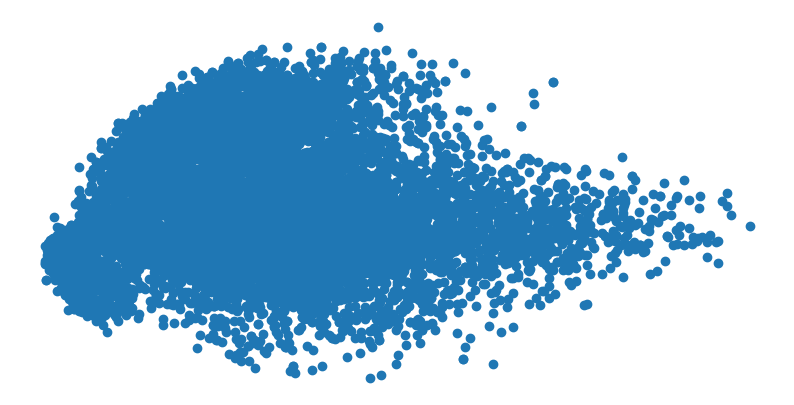

In [9]:
plt.figure(figsize=(10,5))
plt.scatter(pca_components[:, 0], pca_components[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

Are you able to distinguish the different digits in the two-dimensional representation above? Unfortunately, that isn't quite possible. You need to find a better method to achieve this, so you'll be introduced to one later in this module.

### Q1. Now work with the [fashion MNIST dataset](https://github.com/zalandoresearch/fashion-mnist). This is another image dataset that comprises 70,000 grayscale 28x28 images. The dataset contains the following 10 classes:

* T-shirt/top
* List item
* Trouser/pants
* Pullover shirt
* Dress
* Coat
* Sandal
* Shirt
* Sneaker
* Bag
* Ankle boot

### a) First, load the dataset using the `fetch_openml` function of `sklearn.datasets`. Conduct any necessary preprocessing, such as normalizing the data.


In [11]:
mnist = fetch_openml('Fashion-MNIST', version=1, parser='auto', cache=True)

Randomly select 10,000 images as with the *MNIST* data.

In [12]:
np.random.seed(123)

indices = np.random.choice(len(mnist.data), 10000)
X = mnist.data.loc[indices] / 255.0 # Divide by 255 to normalize for RGB (red, green, blue) in image data
y = mnist.target.loc[indices]

print(X.shape, y.shape)

(10000, 784) (10000,)




As before, the size of each image is 784. In fact, all images in Fashion-MNIST are 28 by 28 pixels and 784 is just the result of the multiplication of 28 by 28. So, the data is a flattened version of the images where each row in the 28 x 28 matrix is concatenated side by side.

Plot some images:


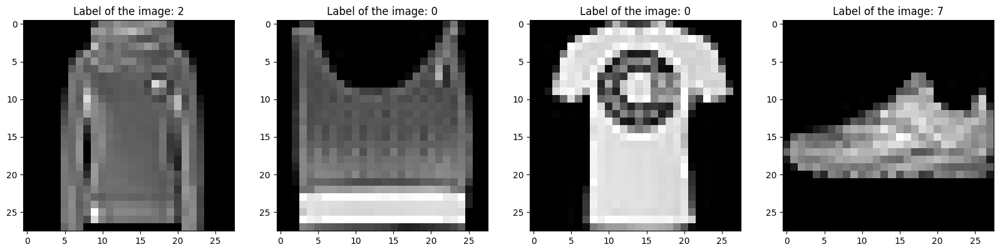

In [13]:
plt.figure(figsize=(20,5))

plt.subplot(141)
plt.imshow(X.iloc[123].values.reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(y.iloc[123]))

plt.subplot(142)
plt.imshow(X.iloc[124].values.reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(y.iloc[124]))

plt.subplot(143)
plt.imshow(X.iloc[125].values.reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(y.iloc[125]))

plt.subplot(144)
plt.imshow(X.iloc[126].values.reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(y.iloc[126]))

plt.show()

### b) Apply PCA to the data and get the first two principal components.

In [14]:
# Return the first two principal components
pca = PCA(n_components=2)

# Get the components by calling the `fit_transform()` method
pca_components = pca.fit_transform(X)

### c) Using the first two principal components, draw a graph of the data by coloring and labeling the data points

In [15]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(pca_components.shape[0]):
    plt.text(pca_components[i, 0], pca_components[i, 1], str(y.iloc[i]),
             color=colours[int(y.iloc[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

### d) Do you think that the PCA solution is satisfactory? Can you easily distinguish between the different classes?

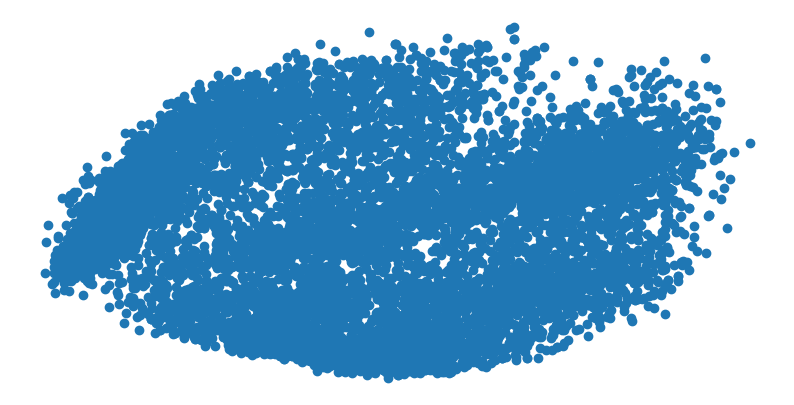

In [16]:
plt.figure(figsize=(10,5))
plt.scatter(pca_components[:, 0], pca_components[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

No, the PCA solution is unsatisfactory. Without coloring and labeling the data points, it is nearly impossible to identify differences in two dimensions. We need a separate data reduction technique to visualize data for MNIST and similar high-dimensional datasets.